# Mapping renewable energy sources in Switzerland

## 1. Import packages

In [1]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import json

We will use Choropleth mapbox to plot the polygons in the GeoJSON object and subsequently color each canton based on the number of renewable energy resources.

In [ ]:
# choroplethmapbox structure
?go.Choroplethmapbox

## 2. Import and match data

### 2.1 Data from CSV

In [2]:
# https://data.open-power-system-data.org/renewable_power_plants/
clean_energy_ch = pd.read_csv('data/renewable_power_plants_CH.csv')
clean_energy_ch.head()

,electrical_capacity,energy_source_level_1,energy_source_level_2,energy_source_level_3,technology,data_source,nuts_1_region,nuts_2_region,nuts_3_region,lon,...,municipality_code,postcode,address,canton,commissioning_date,contract_period_end,company,tariff,project_name,production
0,0.755,Renewable energy,Bioenergy,Biomass and biogas,Other or unspecified technology,BFE,CH0,CH05,CH057,9.0353,...,8514,8514.0,Holzhof / Hüttlingerstrasse 22,TG,2004-07-01,2024-12-31,Otto Wartmann,578451.74,BHKW Wartmann Holzhof Bissegg,1127.504840
1,0.080,Renewable energy,Bioenergy,Biomass and biogas,Other or unspecified technology,BFE,CH0,CH05,CH056,9.8393,...,7260,7260.0,Duchliweg 13,GR,2004-11-24,2024-12-31,Davos Biogas GmbH,228421.43,Biogasanlage Davos,499.121100
2,0.260,Renewable energy,Bioenergy,Biomass and biogas,Other or unspecified technology,BFE,CH0,CH06,CH061,8.2363,...,6294,6294.0,Grundacher 2,LU,2005-10-04,2025-12-31,Armin Müller-Flühler,622598.25,B BHKW Armin Müller-Flühler Ermensee,1475.022780
3,0.450,Renewable energy,Hydro,NaN,Other or unspecified technology,BFE,CH0,CH02,CH021,7.2549,...,2535,2535.0,Rue du canal 41,BE,2006-01-01,2031-12-31,Hydroelectra AG,349496.84,Wasserkraftanlage Frinvillier,1327.936800
4,0.480,Renewable energy,Bioenergy,Biomass and biogas,Other or unspecified technology,BFE,CH0,CH01,CH012,7.9084,...,3930,3930.0,Grosseye 12,VS,2006-01-01,2026-12-31,Val Biogas GmbH,598309.74,Biogas Val Visp,1425.604275


In [3]:
# energy source level breakdown
clean_energy_ch['energy_source_level_2'].value_counts()

Solar        11841
Hydro          575
Bioenergy      264
Wind            38
Name: energy_source_level_2, dtype: int64

### 2.2 Coordinates for cantons via geojson

In [4]:
# coordinates for each canton
with open('data/georef-switzerland-kanton.geojson') as response:
    cantons = json.load(response)

cantons["features"][0]["properties"]

{'kan_type': 'Kanton',
 'geo_point_2d': [46.2204844659, 6.13300925662],
 'kan_code': '25',
 'year': '2020',
 'kan_name': 'Genève',
 'kan_area_code': 'CHE'}

In [ ]:
# geopandas to read file as dataframe
!pip install geopandas

In [7]:
# import geopandas
import geopandas as gpd

# load geojson file and display head
cantons_geo = gpd.read_file('data/georef-switzerland-kanton.geojson')
cantons_geo.head()

,kan_type,kan_code,year,kan_name,kan_area_code,geometry
0,Kanton,25,2020,Genève,CHE,"MULTIPOLYGON (((6.21955 46.31188, 6.21010 46.2..."
1,Kanton,14,2020,Schaffhausen,CHE,"MULTIPOLYGON (((8.59573 47.60561, 8.59274 47.6..."
2,Kanton,04,2020,Uri,CHE,"POLYGON ((8.67875 46.57919, 8.68193 46.58853, ..."
3,Kanton,02,2020,Bern,CHE,"MULTIPOLYGON (((7.09086 46.90382, 7.09072 46.9..."
4,Kanton,10,2020,Fribourg,CHE,"MULTIPOLYGON (((6.77301 46.75137, 6.77017 46.7..."


In [8]:
# coordinates for each canton
with open('data/georef-switzerland-kanton.geojson') as response:
    cantons = json.load(response)

cantons["features"][0]["properties"]

{'kan_type': 'Kanton',
 'geo_point_2d': [46.2204844659, 6.13300925662],
 'kan_code': '25',
 'year': '2020',
 'kan_name': 'Genève',
 'kan_area_code': 'CHE'}

### 2.3 Match data for cantons

In [9]:
# create cantons dictionary to match csv and geojson
cantons_dict = {'TG':'Thurgau', 'GR':'Graubünden', 'LU':'Luzern', 'BE':'Bern', 'VS':'Valais', 
                'BL':'Basel-Landschaft', 'SO':'Solothurn', 'VD':'Vaud', 'SH':'Schaffhausen', 'ZH':'Zürich', 
                'AG':'Aargau', 'UR':'Uri', 'NE':'Neuchâtel', 'TI':'Ticino', 'SG':'St. Gallen', 'GE':'Genève', 
                'GL':'Glarus', 'JU':'Jura', 'ZG':'Zug', 'OW':'Obwalden', 'FR':'Fribourg', 'SZ':'Schwyz', 
                'AR':'Appenzell Ausserrhoden', 'AI':'Appenzell Innerrhoden', 'NW':'Nidwalden', 'BS':'Basel-Stadt'}

# map 'canton' w/ cantons_dict
clean_energy_ch['canton_name'] = clean_energy_ch['canton'].map(cantons_dict)

# data #22 added 'canton_name'
clean_energy_ch.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12718 entries, 0 to 12717
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   electrical_capacity    12718 non-null  float64
 1   energy_source_level_1  12718 non-null  object 
 2   energy_source_level_2  12718 non-null  object 
 3   energy_source_level_3  277 non-null    object 
 4   technology             12587 non-null  object 
 5   data_source            12718 non-null  object 
 6   nuts_1_region          12708 non-null  object 
 7   nuts_2_region          12708 non-null  object 
 8   nuts_3_region          12708 non-null  object 
 9   lon                    12694 non-null  float64
 10  lat                    12694 non-null  float64
 11  municipality           12718 non-null  object 
 12  municipality_code      12718 non-null  int64  
 13  postcode               12694 non-null  float64
 14  address                3929 non-null   object 
 15  ca

In [10]:
# canton_name count
sources_per_canton = clean_energy_ch.groupby('canton_name').size().reset_index(name='count')
sources_per_canton.head()

,canton_name,count
0,Aargau,1092
1,Appenzell Ausserrhoden,153
2,Appenzell Innerrhoden,75
3,Basel-Landschaft,481
4,Basel-Stadt,92


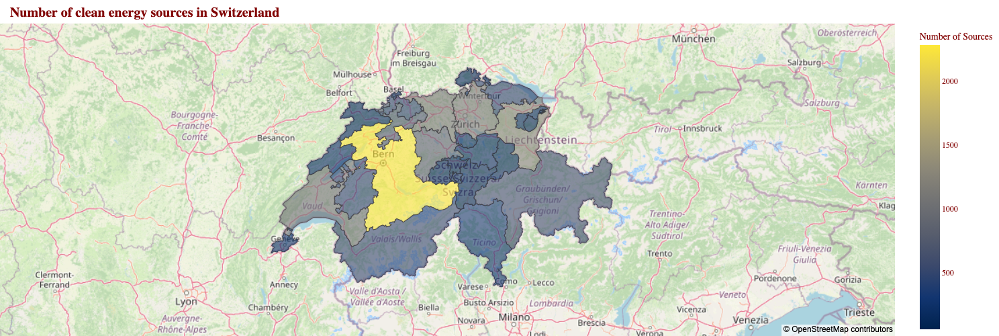

In [11]:
# create map figure using geojson cantons matched with n. sources from our dataset
fig = px.choropleth_mapbox(
    sources_per_canton, 
    color="count",
    geojson=cantons, 
    locations="canton_name", 
    featureidkey="properties.kan_name",
    center={"lat": 46.8, "lon": 8.3},
    mapbox_style="open-street-map", 
    zoom=6.3,
    opacity=0.6,
    width=900,
    height=500,
    labels={"canton_name":"Canton",
           "count":"Number of Sources"},
    title="<b>Number of clean energy sources in Switzerland</b>",
    color_continuous_scale="Cividis",
)

fig.update_layout(margin={"r":0,"t":35,"l":0,"b":0},
                  font={"family":"Sans",
                       "color":"maroon"},
                  hoverlabel={"bgcolor":"white", 
                              "font_size":12,
                             "font_family":"Sans"},
                  title={"font_size":20,
                        "xanchor":"left", "x":0.01,
                        "yanchor":"bottom", "y":0.95}
                 )

fig.show()